# Проектная работа. Рынок заведений общественного питания Москвы

**Описание проекта:** Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Нам нужно подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 

**Цель проекта:** Исследовать рынок общепита Москвы, сделать аналитику и дать ответ заказчику

**Описание данных:** В таблице с даннымиимеются следующие данные: name — название заведения; address — адрес заведения; category — категория заведения,hours — информация о днях и часах работы; lat и lng — широта и долгота географической точки; rating — рейтинг заведения; price — категория цен в заведении; avg_bill — хранит среднюю стоимость заказа в виде диапазона; middle_avg_bill — число с оценкой среднего чекa; middle_coffee_cup — число с оценкой одной чашки капучино; chain — число, которое показывает, является ли заведение сетевым; district — административный район, в котором находится заведение; seats — количество посадочных мест.

**План работы:** 
- Загрить данные и изучить общую информацию; 
- Выполнить предобработку данных; 
- Проанализировать данные; 
- Детализировать исследование: открытие кофейни; 
- Подготовить презентацию;

## Загрузим данные и изучим общую информацию 

**Импортируем библиотеки**

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from numpy import median
from plotly import graph_objects as go
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


***Вывод:*** У нас датафрейм с даннымы содержит в себе 14 столбцов и 8406 строк.

## Предобработку данных


### Проверим данные на дубликаты и пропуски

In [5]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски оставим, тк. в столце price только 3000 строк без пропуска, а в avg_bill половина только заполнена (middle_avg_bill и middle_coffee_cup напрямую связаны с avg_bill)

In [6]:
data.duplicated().sum()

0

Явных дубликатов не обнаружено

### Проверка на неявные дубликаты

Если данные могут быть собраны из разных источников, проверим только 2 столбца 'name' и 'address'(все столбцы кроме 'district' в разных источниках могут содержать разную информацию, для этого переведем данные этого столбца к нижнему регистру 

In [7]:
data['name'] = data['name'].str.lower() 
data['address'] = data['address'].str.lower() 

In [8]:
data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


In [9]:
data.duplicated(subset=['name','address']).sum()

4

In [10]:
data = data.drop_duplicates(keep='last', subset=['name','address'])

In [11]:
data.duplicated(subset=['name','address']).sum()

0

### Добавим столбец street с названиями улиц из столбца с адресом.

In [12]:
data['address'].nunique()

5752

В данных содержится 5753 уникальных адресов

In [13]:
def get_street(address): 
    return address.split(',')[1]

In [14]:
data['street'] = data['address'].apply(get_street)

In [15]:
data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко


### Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [16]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [17]:
data.tail(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True
8405,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,россошанский проезд,True


In [18]:
data['is_24/7'].value_counts()

False    7672
True      730
Name: is_24/7, dtype: int64

С столбце is_24/7 730 заведений сетевиков

***Вывод:*** В датафрейме нет явных дубликатов, есть пропуски, но было решено их оставить, т.к количество пропусков больше 10% от всего объема данных. Добавили 2 столбца: is_24/7 (показывает сетевое заведение или нет) и street (содержит названия улиц) 

## Анализ данных

### Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и т.д. 

In [19]:
data['category'].value_counts()

кафе               2377
ресторан           2041
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            255
Name: category, dtype: int64

In [20]:
total = data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)\
    .reset_index()
total

,category,name
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,255


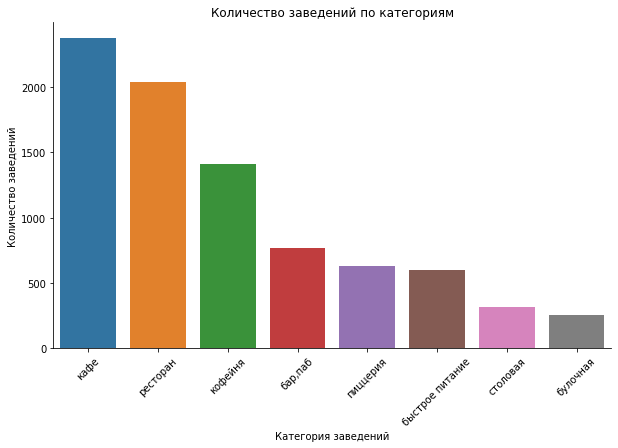

In [21]:
plt.figure(figsize=(10,6))
sns.barplot(x=total['category'], y=total['name'])
sns.set_style('whitegrid')
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45);
plt.ylabel('Количество заведений')
sns.despine() 
plt.show()

В данных больше всего заведений из категории кафе и ресторан (оба больше 2000), чуть уступают бары и пабы 1413шт, меньше всего столовых и булочных

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и т.д. Построим визуализации и проанализируем результаты

In [22]:
seat = data.pivot_table(index='category', values='seats', aggfunc='median').reset_index().sort_values(by='seats', ascending=False)

In [23]:
seat

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


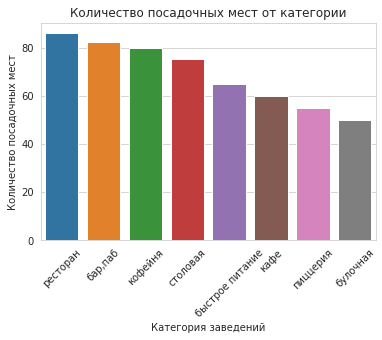

In [24]:
sns.barplot(x=seat['category'], y=seat['seats'])
sns.set_style('whitegrid')
plt.title('Количество посадочных мест от категории')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45);
plt.ylabel('Количество посадочных мест');


Больше всего посадочных мест в рестонах и в барах. В кофейнях на удивление тоже много посадочных мест. Меньше всего в булочных и в пицеериях

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Выясним каких заведений больше

In [25]:
data.groupby('chain')['name'].nunique() ## получим общее количество уникальных заведений 

chain
0    4801
1     747
Name: name, dtype: int64

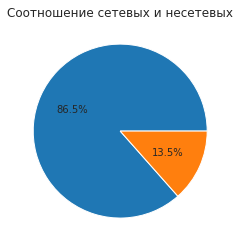

In [26]:
autopct=('%1.1f%%')
plt.pie(data.groupby('chain')['name'].nunique(), autopct=autopct);
plt.title('Соотношение сетевых и несетевых');

В данных содержится 13,6 уникальных сетевых заведений, остальные не являются сетевыми

### Выясним какие категории заведений чаще являются сетевыми. Исследуем данные и ответим на вопрос графиком.

In [27]:
chain = data[data['chain'] == 1] ##отберем только сетевые заведения 
chain.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,базовская улица,False


In [28]:
ch = chain.pivot_table(index='category', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
ch

,category,name
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,156
7,столовая,88


In [29]:
ch.sum(axis=0)

category    кафересторанкофейняпиццериябыстрое питаниебар,...
name                                                     3204
dtype: object

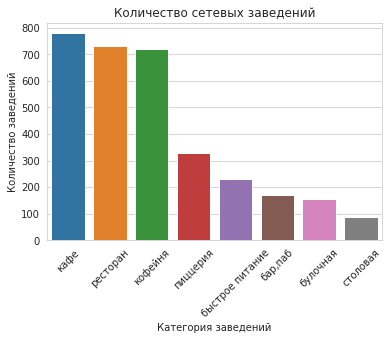

In [30]:
sns.barplot(x='category', y='name', data=ch)
sns.set_style('whitegrid')
plt.title('Количество сетевых заведений')
plt.xlabel('Категория заведений')
plt.xticks(rotation=45);
plt.ylabel('Количество заведений');

Чаще всего сетевыми являются кафе, рестораны и кофейни

### Сгруппируем данные по названиям заведений и найдите топ-15 популярных сетей в Москве и построим визуализацию

In [31]:
chain.head(2) ##самые популярные сети будем искать среди сетевых

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,базовская улица,False


In [32]:
top = chain.pivot_table(index='name', values='category', aggfunc='count').reset_index().sort_values(by='category', ascending=False).head(15)
top

,name,category
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


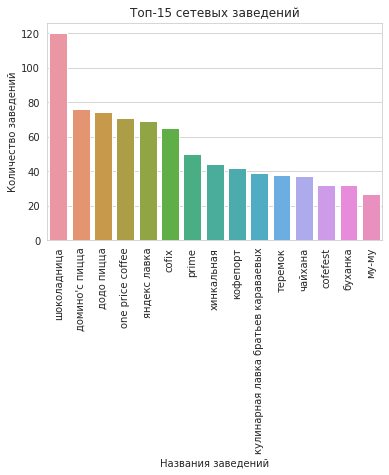

In [33]:
sns.barplot(x='name', y='category', data=top)
sns.set_style('whitegrid')
plt.title('Топ-15 сетевых заведений')
plt.xlabel('Названия заведений')
plt.xticks(rotation=90);
plt.ylabel('Количество заведений');

Самая болльшое количество франшиз у Шоколадницы, лидирует с большим отрывом. Далее идут 2 пиццерии Доминос и Додо.

In [34]:
top = top.merge(data, on='name', how='left')
top.head(2)

,name,category_x,category_y,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,шоколадница,120,кофейня,"москва, дмитровское шоссе, 163ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,дмитровское шоссе,False
1,шоколадница,120,кофейня,"москва, широкая улица, 13а",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0,широкая улица,False


In [35]:
top = top.pivot_table(index='category_y', values='name', aggfunc='count').sort_values(by='name', ascending=False)\
    .reset_index()
top

,category_y,name
0,кофейня,337
1,ресторан,186
2,пиццерия,152
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


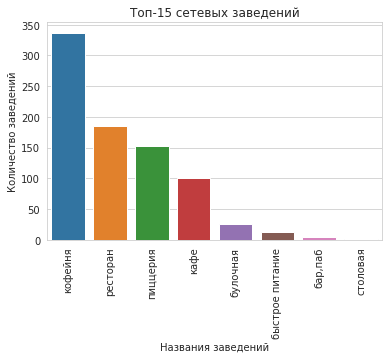

In [36]:
sns.barplot(x='category_y', y='name', data=top)
sns.set_style('whitegrid')
plt.title('Топ-15 сетевых заведений')
plt.xlabel('Названия заведений')
plt.xticks(rotation=90);
plt.ylabel('Количество заведений');

В топе больше всего кофеен и опережают преследователей с большим отрывом, далее идут рестораны и пиццерии

### Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [37]:
data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


In [38]:
dist = data.pivot_table(index = 'district', columns = 'category', values = 'name', aggfunc='count')

In [39]:
dist['sum'] = dist.sum(axis= 1 )

In [40]:
dist = dist.sort_values(by='sum',ascending=False)

In [41]:
del dist['sum']

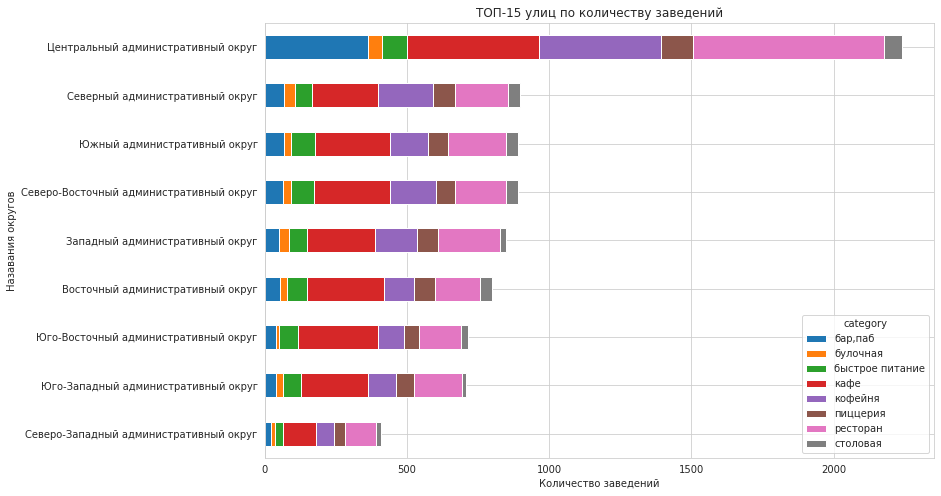

In [42]:
ax = dist.plot(kind='barh', stacked=True, figsize=(12,8))
ax.invert_yaxis()
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Назавания округов')
ax.set_title('ТОП-15 улиц по количеству заведений');

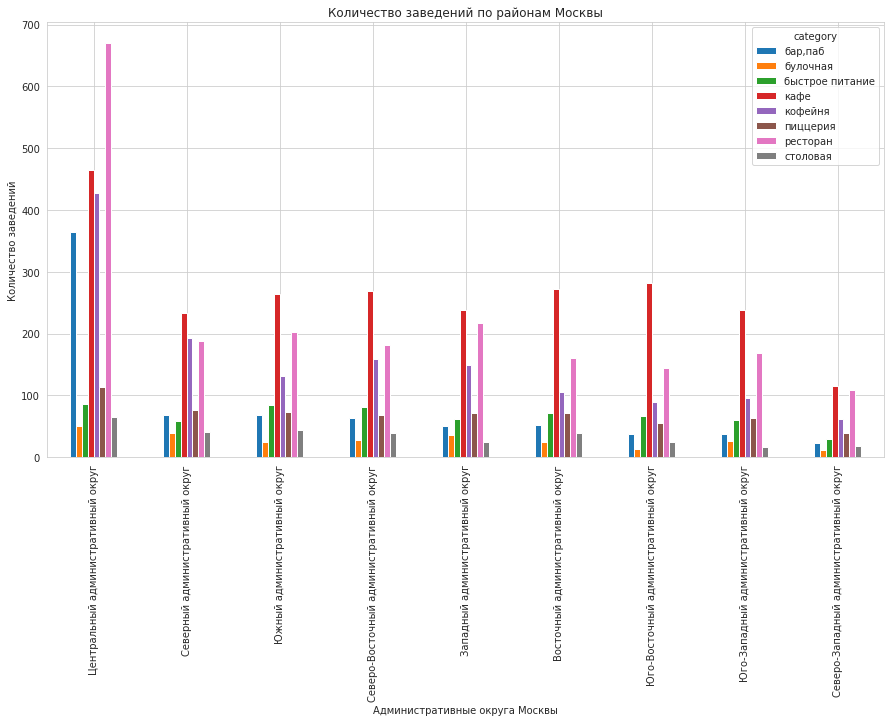

In [43]:
dist.plot(kind='bar', figsize=(15,8));
plt.title('Количество заведений по районам Москвы')
plt.xlabel('Административные округа Москвы')
plt.ylabel('Количество заведений');

Больше всего заведений в ЦАО, а самое меньше количество в СЗАО, остальные округа примерно на 1 уровне 

### Визуализируем распределение средних рейтингов по категориям заведений. 

In [44]:
mean = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()
mean

,category,rating
0,"бар,паб",4.387712
1,булочная,4.269020
2,быстрое питание,4.050249
3,кафе,4.124274
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290348
7,столовая,4.211429


In [45]:
fig = go.Figure(data=[go.Pie(labels=mean['category'], values=mean['rating'], title='Распределение среднего рейтинга по округам')])
fig.show()


Рейтинги вне зависимости от категории на одном уровне 

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [46]:
mean = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
mean

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [47]:
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=mean,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)
# выводим карту
m

Самые высокие рейтинги в ЦАО, но и в других округах  рейтинги не сильно ниже 

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [48]:
# создаём карту Москвы
map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
map

### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [49]:
data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False


In [50]:
st = data.pivot_table(index='street', columns='category', values='name', aggfunc='count')
st.reset_index()

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,1-й автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1,1-й балтийский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
2,1-й варшавский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,1-й вешняковский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
4,1-й волоколамский проезд,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
...,...,...,...,...,...,...,...,...,...
1442,ясеневая улица,NaN,NaN,1.0,2.0,4.0,2.0,3.0,NaN
1443,ясногорская улица,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN
1444,яузская улица,2.0,NaN,NaN,1.0,3.0,NaN,1.0,NaN
1445,яузский бульвар,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [51]:
st['sum'] = st.sum(axis=1)

In [52]:
street = st.sort_values(by='sum', ascending=False).head(15)

In [53]:
del street['sum']

In [54]:
street

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект мира,12.0,4.0,21.0,53.0,36.0,11.0,44.0,2.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


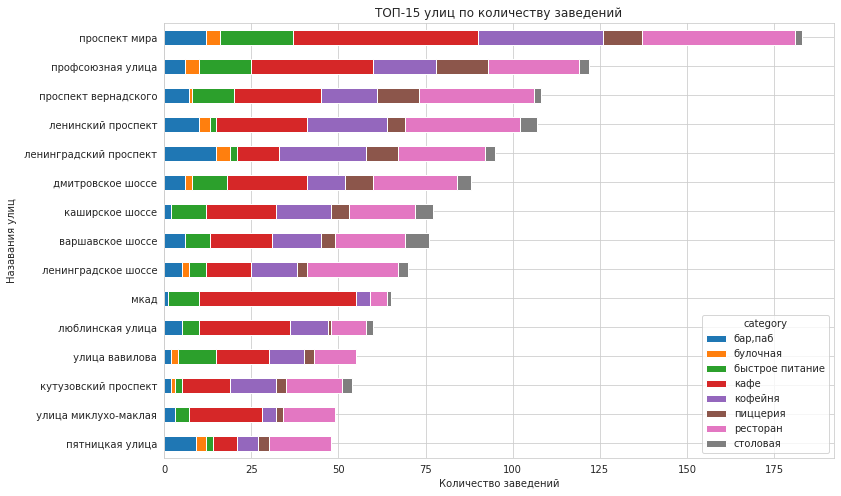

In [55]:
ax = street.plot(kind='barh', stacked=True, figsize=(12,8))
ax.invert_yaxis()
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Назавания улиц')
ax.set_title('ТОП-15 улиц по количеству заведений');

Больше всего заведений находится на проспекте Мира, в лидирующих позициях находятся самые длинные улицы Москвы, и Муклухо-Маклая со студенческими дородками вдоль улицы. 

### Найдем улицы, на которых находится только один объект общепита. 

In [56]:
st = st.loc[(st['sum'] < 2)].reset_index()
st.head(2)

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
0,1-й автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
1,1-й балтийский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0


In [57]:
st.count()

category
street             457
бар,паб             39
булочная             8
быстрое питание     23
кафе               159
кофейня             84
пиццерия            15
ресторан            93
столовая            36
sum                457
dtype: int64

In [58]:
st = st.merge(data, on='street', how='left')
st.head(2) 

,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum,...,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20.0,True
1,1-й балтийский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,...,55.810418,37.518824,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,60.0,False


In [59]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
st.apply(create_marker, axis=1)
    
# выводим карту
m

Таких улиц 458, на таких улицам меньше всего булочных, больше кафе. Эти улицы находятся ближе к МКАД 

### Посчитаем медиану значений средних чеков для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других.

In [60]:
bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [61]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый большой средний чек в ЦАО И ЗАО, самы дешевые районы СВАО, ЮАО и ЮВАО

### Определим заведения, где средний чек выше 75% процендили и выясним расположение на карте 

In [62]:
data['middle_avg_bill'].describe() ##выясним процендили по среднему чеку. Выбираем заведения дороже 75процендили

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [63]:
lux = data.loc[(data['middle_avg_bill'] > 1250)]
lux.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
14,у сильвы,"бар,паб","москва, ангарская улица, 42с1",Северный административный округ,"ежедневно, 13:00–00:00",55.885528,37.528371,4.2,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,0,NaN,ангарская улица,False


In [64]:
lux_m = lux.pivot_table(index='district', values='middle_avg_bill', aggfunc='count').reset_index()
lux_m

,district,middle_avg_bill
0,Восточный административный округ,36
1,Западный административный округ,84
2,Северный административный округ,69
3,Северо-Восточный административный округ,33
4,Северо-Западный административный округ,23
5,Центральный административный округ,346
6,Юго-Восточный административный округ,19
7,Юго-Западный административный округ,32
8,Южный административный округ,40


In [65]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
lu = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=lux_m,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(lu)

# выводим карту
lu

Больше всего заведений со средним чеком больше 75 процендили в ЦОА, далее идет ЗАО

Посмотрим какие это заведения 

In [66]:
lux = lux.pivot_table(index='district', columns='category', values='name', aggfunc='count')
lux

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,10.0,NaN,1.0,4.0,NaN,4.0,17.0,NaN
Западный административный округ,7.0,1.0,NaN,11.0,1.0,5.0,58.0,1.0
Северный административный округ,16.0,NaN,NaN,7.0,2.0,4.0,40.0,NaN
Северо-Восточный административный округ,4.0,NaN,NaN,5.0,NaN,1.0,23.0,NaN
Северо-Западный административный округ,1.0,NaN,NaN,5.0,NaN,1.0,16.0,NaN
Центральный административный округ,81.0,4.0,1.0,21.0,16.0,24.0,199.0,NaN
Юго-Восточный административный округ,3.0,NaN,2.0,2.0,NaN,2.0,10.0,NaN
Юго-Западный административный округ,1.0,NaN,NaN,3.0,NaN,4.0,24.0,NaN
Южный административный округ,10.0,NaN,NaN,5.0,NaN,3.0,22.0,NaN


In [67]:
lux['sum'] = lux.sum(axis=1)
lux = lux.sort_values(by='sum', ascending=False).head(15)
del lux['sum']

In [68]:
lux

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Центральный административный округ,81.0,4.0,1.0,21.0,16.0,24.0,199.0,NaN
Западный административный округ,7.0,1.0,NaN,11.0,1.0,5.0,58.0,1.0
Северный административный округ,16.0,NaN,NaN,7.0,2.0,4.0,40.0,NaN
Южный административный округ,10.0,NaN,NaN,5.0,NaN,3.0,22.0,NaN
Восточный административный округ,10.0,NaN,1.0,4.0,NaN,4.0,17.0,NaN
Северо-Восточный административный округ,4.0,NaN,NaN,5.0,NaN,1.0,23.0,NaN
Юго-Западный административный округ,1.0,NaN,NaN,3.0,NaN,4.0,24.0,NaN
Северо-Западный административный округ,1.0,NaN,NaN,5.0,NaN,1.0,16.0,NaN
Юго-Восточный административный округ,3.0,NaN,2.0,2.0,NaN,2.0,10.0,NaN


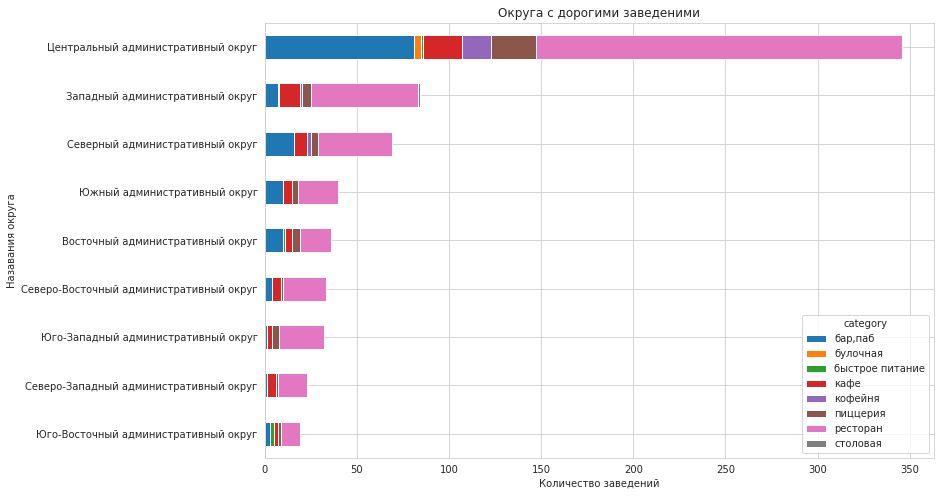

In [69]:
ax = lux.plot(kind='barh', stacked=True, figsize=(12,8))
ax.invert_yaxis()
ax.set_ylabel('Назавания округа')
ax.set_xlabel('Количество заведений')
ax.set_title('Округа с дорогими заведеними');

Во всех округах больше всего ресторанов. В ЦАО только баров столько, сколько в ЗАО всех заведений в сумме, а в остальных округах количество дорогих заведений еще меньше

### Соберем наблюдения по вопросам выше в один общий вывод.

***Вывод:*** После анализа данных, обнаружили что: в данных больше всего заведений из категории кафе и ресторан (в обоих больше 2000), чуть уступают бары и пабы 1413 шт, меньше всего столовых и булочных. Больше всего посадочных мест в рестонах и в барах (в кофейнях на удивление тоже много посадочных мест), меньше всего в булочных и в пицеериях. 
Выяснили что, в данных содержится 13,6% уникальных сетевых заведений, остальные не являются сетевыми. Чаще всего сетевыми являются кафе, рестораны и кофейни. Самое болльшое количество франшиз у Шоколадницы, лидирует с большим отрывом. Далее идут 2 пиццерии Доминос и Додо.
Больше всего заведений расположены в ЦАО, а самое меньше количество в СЗАО, остальные округа примерно на 1 уровне. Рейтинги заведений вне зависимости от категории на одном уровне, если смотреть по округам, то самые высокие в ЦАО, но и в других округах рейтинги не сильно ниже. Больше всего заведений находится на проспекте Мира, в лидирующих позициях находятся самые длинные улицы Москвы, и Муклухо-Маклая со студенческими дородками вдоль улицы. Обнаружены 458 с 1одним только заведением, на таких улицам меньше всего булочных, больше кафе. 
Самый большой средний чек в ЦАО И ЗАО, самые дешевые районы СВАО, ЮАО и ЮВАО. 
Больше всего заведений со средним чеком больше 75 процендили в ЦОА, далее идет ЗАО, но если смотреть на категории заведений, то во всех округах больше всего ресторанов. Еще что интересно: В ЦАО только баров столько, сколько в ЗАО всех заведений в сумме, а в остальных округах количество дорогих заведений еще меньше

## Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете?

In [70]:
coffee = data.loc[(data['category'] == 'кофейня')]
coffee['category'].count()

1413

В данных содержится информация о 1413 кофеен

### В каких районах их больше всего, каковы особенности их расположения?

In [71]:
coffee.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False


In [72]:
total_cof = coffee.pivot_table(index='district', values='category', aggfunc='count')\
    .reset_index()\
    .sort_values(by='category',ascending=False)
total_cof

,district,category
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


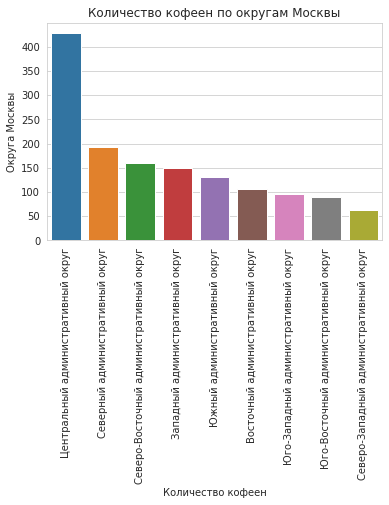

In [73]:
sns.barplot(x=total_cof['district'], y=total_cof['category'])
sns.set_style('whitegrid')
plt.title('Количество кофеен по округам Москвы')
plt.xlabel('Количество кофеен')
plt.xticks(rotation=90);
plt.ylabel('Округа Москвы');

Как и ожидалось, больше всего кофеен находится в ЦАО. Там в 2 раза больше кофеен чем у идущего следом САО. СЗАО всего 62 кофейни

### Есть ли круглосуточные кофейни?

In [74]:
coffee.loc[(coffee['is_24/7'] == 1)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,долгоруковская улица,True


In [75]:
coffee.loc[(coffee['is_24/7'] == 1)]['name'].count()

59

По Москве 59 круглосуточных кофеен.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [76]:
cof_rat = coffee.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()\
    .sort_values(by='rating', ascending=False)
cof_rat

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [77]:
fig = go.Figure(data=[go.Pie(labels=cof_rat['district'], values=cof_rat['rating'], title='Распределение среднего рейтинга по округам')])
fig.show()

Ситуация такая же как и у всего общепита, рейтинги одинаковые и не сильно друг от друга отличаются 

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [78]:
cap = coffee.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')\
    .reset_index().sort_values(by='middle_coffee_cup', ascending=False)
cap

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [79]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
lu = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cap,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(lu)

# выводим карту
lu

Самый дорогой кофе в ЮЗАО, на 9 и 10 р дешевле в ЦАО и ЗАО. Самый дешевый в ВАО (135р.)

### Помощь 

In [80]:
coffee['middle_coffee_cup'].describe() ##выясним процендили цен на кофе

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Посмотрим на заведения, где чашка кофе стоит дороже 50 процендили и рейтинг 5

In [81]:
coffee.loc[(coffee['rating'] >= 5) & (coffee['middle_coffee_cup'] >= 170)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
1283,pique-nique,кофейня,"москва, 3-я радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.818584,37.490628,5.0,низкие,Цена чашки капучино:170–220 ₽,NaN,195.0,0,NaN,3-я радиаторская улица,False
1307,nero bean coffee roastery,кофейня,"москва, ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.809720,37.507711,5.0,NaN,Цена чашки капучино:150–250 ₽,NaN,200.0,0,232.0,ленинградский проспект,False
1824,саббиа кофе,кофейня,"москва, ходынский бульвар, 4",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.790709,37.529956,5.0,NaN,Цена чашки капучино:195–295 ₽,NaN,245.0,0,100.0,ходынский бульвар,False


Нужно, смотреть бизнес модель кофейни Dormouse Coffee Shop, Pique-Nique, Nero Bean Coffee Roastery и Саббиа кофе, у этих кофеен рейтинг 5 (самый высокий) и достаточно высокая стоимость кофе, хорошо для окупаемости. Что еще можно заметить, это то что эти кофейни находятся в САО.

***Вывод:*** В данных содержится информация о 1413 кофеен. Как и ожидалось, больше всего кофеен находится в ЦАО. Там в 2 раза больше кофеен чем у идущего следом САО. В СЗАО всего 62 кофейни. По Москве всего 59 круглосуточных кофеен. Если смотреть на рейтинги, то ситуация такая же как и у всего общепита, рейтинги одинаковые и не сильно друг от друга отличаются от района. 
Самый дорогой кофе в ЮЗАО 198р., в ЦАО и ЗАО на 9 и 10 р дешевле соответственно. Самый дешевый в ВАО (135р.)
Стоит обратить внимание на бизнес модель кофейни Dormouse Coffee Shop, Pique-Nique, Nero Bean Coffee Roastery и Саббиа кофе, у этих кофеен рейтинг 5 (самый высокий) и достаточно высокая стоимость кофе, хорошо для окупаемости. Что еще можно заметить, это то что эти кофейни находятся в САО.

## Вывод: 

Нами в ходи проекта был исследован рынок общепита Москвы. Выяснили, что у нас датафрейм с даннымы содержит в себе 14 столбцов и 8406 строк. В датафрейме нет явных дубликатов, есть пропуски, но было решено их оставить, т.к количество пропусков больше 10% от всего объема данных. Добавили 2 столбца: is_24/7 (показывает сетевое заведение или нет) и street (содержит названия улиц). При анализе данных, обнаружили что: в данных больше всего заведений из категории кафе и ресторан (в обоих больше 2000), чуть уступают бары и пабы 1413 шт, меньше всего столовых и булочных. Больше всего посадочных мест в рестонах и в барах (в кофейнях на удивление тоже много посадочных мест), меньше всего в булочных и в пицеериях. Выяснили что, в данных содержится 13,6 уникальных сетевых заведений, остальные не являются сетевыми. Чаще всего сетевыми являются кафейни, далее идут рестораны и пицерии. Самое болльшое количество франшиз у Шоколадницы, лидирует с большим отрывом. Далее идут 2 пиццерии Доминос и Додо. Больше всего заведений расположены в ЦАО, а самое меньше количество в СЗАО, остальные округа примерно на 1 уровне. Рейтинги заведений вне зависимости от категории на одном уровне, если смотреть по округам, то самые высокие в ЦАО, но и в других округах рейтинги не сильно ниже. Больше всего заведений находится на проспекте Мира, в лидирующих позициях находятся самые длинные улицы Москвы, и Муклухо-Маклая со студенческими дородками вдоль улицы. Обнаружены 458 с 1одним только заведением, на таких улицам меньше всего булочных, больше кафе. Самый большой средний чек в ЦАО И ЗАО, самые дешевые районы СВАО, ЮАО и ЮВАО. Больше всего заведений со средним чеком больше 75 процендили в ЦОА, далее идет ЗАО, но если смотреть на категории заведений, то во всех округах больше всего ресторанов. Еще что интересно: В ЦАО только баров столько, сколько в ЗАО всех заведений в сумме, а в остальных округах количество дорогих заведений еще меньше.
 Для инвестеров был проанализированы данные по кофейням. Обнаружили, что в данных содержится информация о 1413 кофеен. Как и ожидалось, больше всего кофеен находится в ЦАО. Там в 2 раза больше кофеен чем у идущего следом САО. В СЗАО всего 62 кофейни. По Москве всего 59 круглосуточных кофеен. Если смотреть на рейтинги, то ситуация такая же как и у всего общепита, рейтинги одинаковые и не сильно друг от друга отличаются от района. Самый дорогой кофе в ЮЗАО 198р., в ЦАО и ЗАО на 9 и 10 р дешевле соответственно. Самый дешевый в ВАО (135р.) Стоит обратить внимание на бизнес модель кофейни Dormouse Coffee Shop, Pique-Nique, Nero Bean Coffee Roastery и Саббиа кофе, у этих кофеен рейтинг 5 (самый высокий) и достаточно высокая стоимость кофе, хорошо для окупаемости. Что еще можно заметить, это то что эти кофейни находятся в САО.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Спасибо за развернутый вывод!
</div>

## Презентация 

Презентация: https://disk.yandex.ru/i/-tgFluP-OShS7g 